In [1]:
import sys
sys.path.append('/home/l_bechir/github/aare/build')

In [2]:
from _aare import *
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import mpld3
mpld3.enable_notebook()

ImportError: To be able to register buffer protocol support for the type '_aare.Frame' the associated class<>(..) invocation must include the pybind11::buffer_protocol() annotation!

In [ ]:
import _aare
dir(_aare)

In [4]:
!pwd

/home/l_bechir/github/aare/src/python/example


In [5]:
file = File("../../../data/jungfrau/jungfrau_single_master_0.json")
file.rows,file.cols,file.bitdepth,file.detector_type

(512, 1024, 16, <DetectorType.Jungfrau: 0>)

In [6]:
frame = file.read()
frame.rows,frame.cols,frame.bitdepth

(512, 1024, 16)

In [7]:
frame.array()

array([[2123, 2852, 2821, ..., 3007, 3039, 2677],
       [2691, 3291, 3284, ..., 3246, 3189, 2960],
       [3062, 3222, 3080, ..., 3016, 3198, 2942],
       ...,
       [2679, 3041, 2709, ..., 3399, 3190, 3068],
       [2985, 3063, 2908, ..., 3211, 3231, 3137],
       [2326, 2480, 2893, ..., 2925, 3354, 3252]], dtype=uint16)

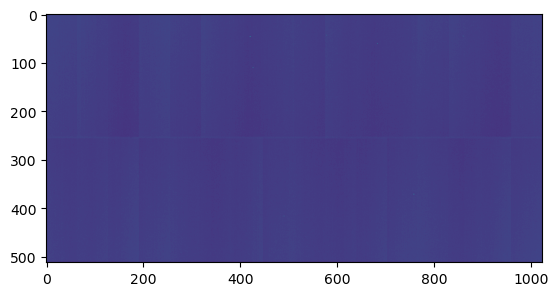

In [8]:
plt.imshow(frame.array())
plt.show()

In [9]:
file = File("/mnt/sls_det_storage/moench_data/testNewFW20230714/cu_half_speed_master_4.json")
file.rows,file.cols,file.detector_type

(400, 400, <DetectorType.Moench: 3>)

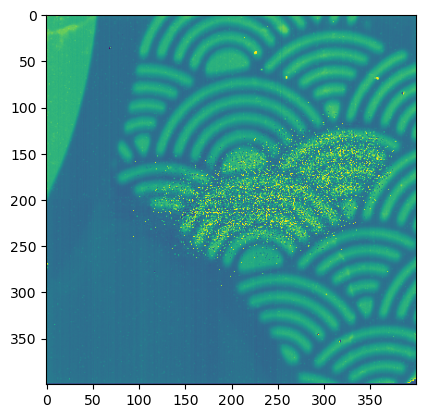

In [10]:
frame = file.read()
nparray = frame.array()
plt.imshow(nparray)
plt.show()

In [11]:
cluster_file = ClusterFileV2("/mnt/sls_det_storage/moench_data/testNewFW20230714/clust/cu_half_speed_d0_f0_4.clust",'r')
cluster_file.frame_number()

23389

In [12]:
cluster_file.frame_number()

23389

In [13]:
pedestal = Pedestal(file.rows,file.cols)

In [14]:
for i in range(1000):
    frame = file.iread(i)
    pedestal.push(frame)
    

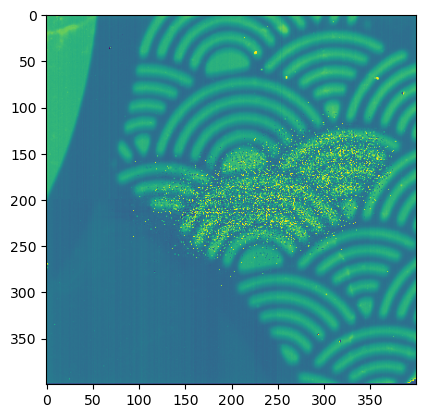

In [15]:
ndarray = pedestal.mean()
plt.imshow(np.array(ndarray))
plt.show()

In [16]:
pedestal.mean()[0,0], file.iread(0).array()[0,0]

(4407.045, 4488)

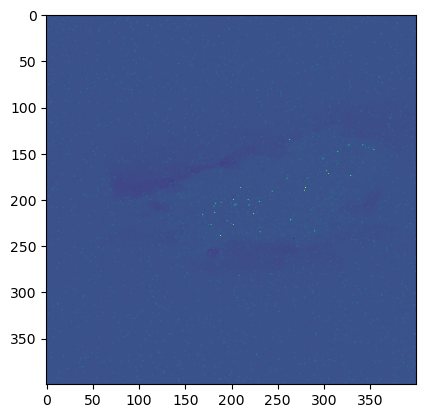

In [17]:
denoised_array = file.iread(0).array()-np.array(pedestal.mean())
plt.imshow(denoised_array)
plt.show()

In [18]:
#find frame with frame_number 23389
frame=None
for i in range(file.total_frames):
    fn = file.frame_number(i)
    if(fn==cluster_file.frame_number()):
        frame=file.iread(i)
        break
i,file.frame_number(i),frame.array()        
    


(1012,
 23389,
 array([[ 4421,  4267,  4534, ...,  4257,  4277,  4427],
        [11941, 11688, 11716, ...,  7054,  7370,  7448],
        [11738, 11381, 11393, ...,  6787,  7152,  7092],
        ...,
        [ 7265,  7007,  6977, ...,  4084,  4180,  4305],
        [ 7188,  7334,  6944, ...,  4084,  4346,  4266],
        [ 4157,  4290,  4343, ...,  4248,  4366,  4462]], dtype=uint16))

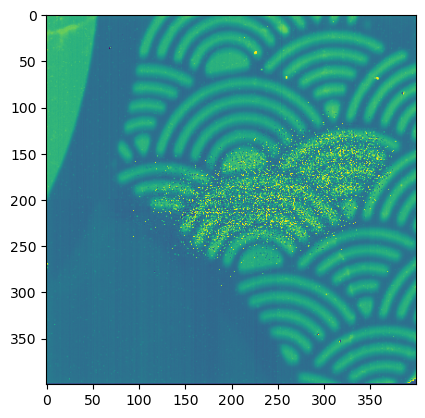

In [19]:
plt.imshow(frame.array())

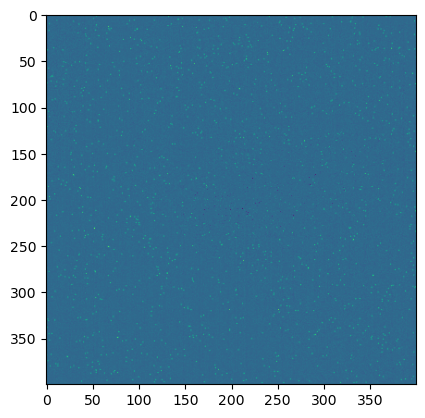

In [20]:
plt.imshow(frame.array()-pedestal.mean())

In [41]:
cluster_finder = ClusterFinder(3,3,5.0,0)
clusters = cluster_finder.find_clusters_without_threshold(frame.array(),pedestal,True)
len(clusters)

1245

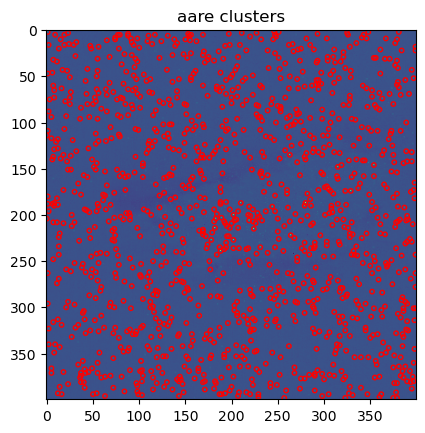

In [40]:
cluster_x = [cluster.x for cluster in clusters]
cluster_y = [cluster.y for cluster in clusters]
plt.imshow(frame.array()-pedestal.mean())
plt.scatter(cluster_x,cluster_y, s=10, facecolors='none', edgecolors='r')
plt.title("aare clusters")
plt.show()

In [23]:
anna_clusters=cluster_file.read()
len(anna_clusters)

305

In [24]:
clusters[0]

<Cluster: x: 19, y: 1>

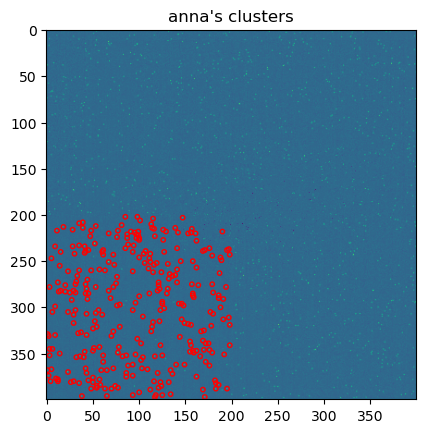

In [25]:
cluster_x = [cluster.cluster.x for cluster in anna_clusters]
cluster_y = [cluster.cluster.y for cluster in anna_clusters]

plt.imshow(frame.array()-pedestal.mean())
plt.scatter(cluster_x,cluster_y, s=10, facecolors='none', edgecolors='r')
plt.title("anna's clusters")
plt.show()

In [26]:
frame.array()

array([[ 4421,  4267,  4534, ...,  4257,  4277,  4427],
       [11941, 11688, 11716, ...,  7054,  7370,  7448],
       [11738, 11381, 11393, ...,  6787,  7152,  7092],
       ...,
       [ 7265,  7007,  6977, ...,  4084,  4180,  4305],
       [ 7188,  7334,  6944, ...,  4084,  4346,  4266],
       [ 4157,  4290,  4343, ...,  4248,  4366,  4462]], dtype=uint16)

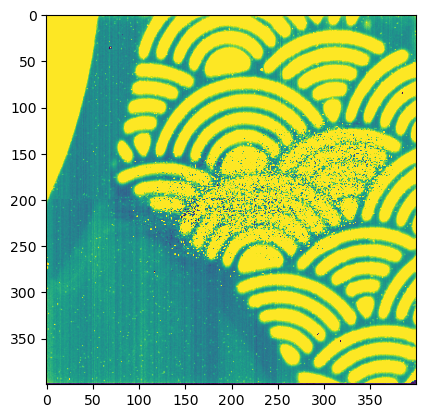

In [27]:
frame = file.iread(0)
plt.imshow(frame.array())
plt.clim(4000,8000)
plt.show()

(array([ 3.,  0.,  0.,  0.,  1.,  0.,  1.,  0.,  1.,  0.,  2.,  1.,  3.,
         0.,  0.,  1.,  2.,  1.,  0.,  2.,  0.,  2.,  0.,  4.,  4.,  2.,
         6.,  4.,  3.,  5.,  2.,  4.,  7.,  6.,  7.,  7., 10.,  5., 10.,
        15., 14.,  8., 11., 25., 24., 33., 22., 40., 30., 39., 39., 31.,
        47., 46., 48., 42., 51., 42., 50., 38., 41., 36., 34., 43., 36.,
        21., 33., 26., 13., 29., 24., 11.,  9., 17., 13., 15.,  8.,  5.,
         4.,  4.,  4.,  7.,  2.,  1.,  1.,  1.,  0.,  1.,  0.,  0.,  0.,
         0.,  3.,  0.,  1.,  0.,  0.,  0.,  0.,  1.]),
 array([ 4591.  ,  4652.54,  4714.08,  4775.62,  4837.16,  4898.7 ,
         4960.24,  5021.78,  5083.32,  5144.86,  5206.4 ,  5267.94,
         5329.48,  5391.02,  5452.56,  5514.1 ,  5575.64,  5637.18,
         5698.72,  5760.26,  5821.8 ,  5883.34,  5944.88,  6006.42,
         6067.96,  6129.5 ,  6191.04,  6252.58,  6314.12,  6375.66,
         6437.2 ,  6498.74,  6560.28,  6621.82,  6683.36,  6744.9 ,
         6806.44,  6867.98

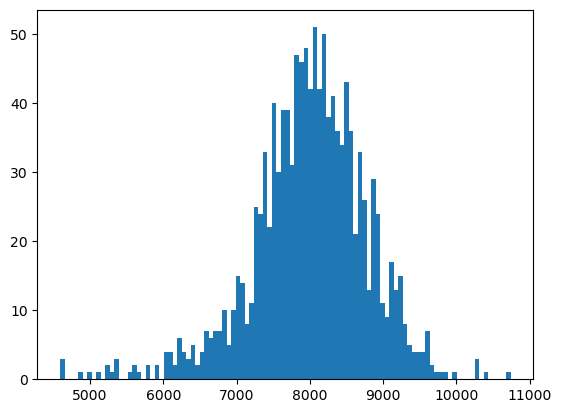

In [38]:
arr=[]
for c in clusters:
    arr.append(np.array(c.data(),np.double).sum())
plt.hist(arr,bins=100)